In [1]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib as mp
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import scipy as sp
import scipy.stats
import seaborn as sns
from matplotlib import cm
import networkx as nx
import pandas as pd
import itertools
# Using matplotlib notebook allows you to interact with the resulting 3-D figure
%matplotlib inline

In [2]:
refc = pd.read_csv('Data/mark_us_curv.csv', index_col = 0)
refc.columns = refc.columns.astype('float')

In [3]:
refc.head()

,-0.50,-0.48,-0.46,-0.44,-0.42,-0.40,-0.38,-0.36,-0.34,-0.32,...,0.30,0.32,0.34,0.36,0.38,0.40,0.42,0.44,0.46,0.48
-0.50,0.444590,0.444590,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,-0.324359,-0.324359,0.000000,0.0,0.0,0.0,0.0,0.0
-0.48,0.560691,0.444590,0.44459,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,-0.324359,-0.324359,-0.324359,-0.324359,0.0,0.0,0.0,0.0,0.0
-0.46,0.560691,0.560691,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,-0.324359,-0.324359,-0.324359,-0.324359,0.0,0.0,0.0,0.0,0.0
-0.44,0.560691,0.560691,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.2,...,-0.324359,-0.324359,-0.324359,-0.324359,0.000000,0.0,0.0,0.0,0.0,0.0
-0.42,0.560691,0.000000,0.00000,0.0,0.0,0.0,0.0,0.0,0.2,0.2,...,-0.324359,-0.324359,-0.324359,-0.324359,0.000000,0.0,0.0,0.0,0.0,0.0


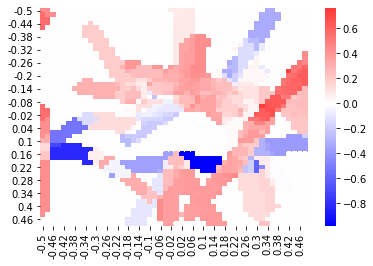

In [4]:
sns.heatmap(refc, cmap = cm.bwr, center = 0)

### Create the 3D Mesh and its Triangulation

First create a 2D x-y mesh

In [5]:
cellcoords = np.array(list(itertools.product(refc.index, refc.columns)), dtype='float')
# we assume that ncols = nrows in the input dataframe
gridsize = len(refc.columns)
x = np.reshape(cellcoords[:,0], (gridsize, gridsize))
y = np.reshape(cellcoords[:,1], (gridsize, gridsize))
z = np.zeros((gridsize, gridsize))
curvatures = np.reshape([refc.loc[x, y] for x, y in itertools.product(refc.index, refc.columns)], 
                        (gridsize, gridsize))

In [6]:
# x and y are the corresponding indices of a 2D mesh
# x, y = np.mgrid[-edge:edge:.05, -edge:edge:.05]
# create the structure needed for evaluating pdfs
pos = np.empty(x.shape + (2,))
pos[:, :, 0] = x; pos[:, :, 1] = y
gridsize = x.shape[0]

In [7]:
x

array([[-0.5 , -0.5 , -0.5 , ..., -0.5 , -0.5 , -0.5 ],
       [-0.48, -0.48, -0.48, ..., -0.48, -0.48, -0.48],
       [-0.46, -0.46, -0.46, ..., -0.46, -0.46, -0.46],
       ...,
       [ 0.44,  0.44,  0.44, ...,  0.44,  0.44,  0.44],
       [ 0.46,  0.46,  0.46, ...,  0.46,  0.46,  0.46],
       [ 0.48,  0.48,  0.48, ...,  0.48,  0.48,  0.48]])

Now create the triangulation of the 3D mesh

In [8]:
# we compute the triangulation explicitly so as to 
# have complete control over it

class trngln:
    
    def __init__(self, gridsize):
        self.gridsize = gridsize
        
    def triangles(self):
        '''
        triangs is a list of 3-tuples
        each 3-tuple consists of the (1D) indices of the triangle's vertices
        '''
        self.triangs = []
        for i in range(self.gridsize-1):
            for j in range(self.gridsize-1):
                self.triangs.append(self.triang1(i,j))
                self.triangs.append(self.triang2(i,j))  
        return self.triangs
    
    def triangles_of_vertex(self):
        '''
        return a dictionary giving the triangles for any vertex
        '''
        try:
            self.triangs
        except NameError:
            self.triangles()
        #
        t_of_v = {}
        for T in self.triangs:
            for pt in T:
                if pt in t_of_v:
                    t_of_v[pt].append(T)
                else:
                    t_of_v[pt] = [T]
        return t_of_v
        
    def coord_to_ndx(self, i, j):
        return i*self.gridsize + j

    def ndx_to_coord(self, b):
        return [(b // self.gridsize), (b % self.gridsize)]

    # each square in the mesh is divided into two triangles
    def triang1(self, i, j):
        return [self.coord_to_ndx(i, j), self.coord_to_ndx(i+1, j),
                self.coord_to_ndx(i, j+1)]

    def triang2(self, i, j):
        return [self.coord_to_ndx(i+1, j), self.coord_to_ndx(i+1, j+1),
                self.coord_to_ndx(i, j+1)]
    
    def mesh_graph(self):
        # create this mesh as a graph as well, for visualization or smoothing
        G = nx.Graph()
        for i in range(self.gridsize):
            for j in range(self.gridsize):
                G.add_node(self.coord_to_ndx(i, j), pos=(i,j))
        #
        for i in range(self.gridsize-1):
            for j in range(self.gridsize-1):
                G.add_edge(self.coord_to_ndx(i, j), self.coord_to_ndx(i+1, j))
                G.add_edge(self.coord_to_ndx(i, j), self.coord_to_ndx(i, j+1))
        #
        for i in range(1, self.gridsize):
            for j in range(self.gridsize-1):
                G.add_edge(self.coord_to_ndx(i, j), self.coord_to_ndx(i-1, j+1))
        #       
        return G
    
    def regularization_graph(self):
        
        G = self.mesh_graph()
        
        # Note: these edges are not in the triangulation
        # However for regularization they are useful to get symmetric regularization
        for i in range(1, self.gridsize):
            for j in range(1, self.gridsize):
                G.add_edge(self.coord_to_ndx(i, j), self.coord_to_ndx(i-1, j-1))
        for j in range(self.gridsize-1):
            G.add_edge(self.coord_to_ndx(self.gridsize-1, j), self.coord_to_ndx(self.gridsize-1, j+1))
        for i in range(self.gridsize-1):
            G.add_edge(self.coord_to_ndx(i, self.gridsize-1), self.coord_to_ndx(i+1, self.gridsize-1))

        return G

In [9]:
Tr = trngln(gridsize)
triangles = Tr.triangles()

In [10]:
G = Tr.regularization_graph()
L = nx.laplacian_matrix(G)
L3 = L @ L @ L

### Sanity checking the triangulation and Laplacian

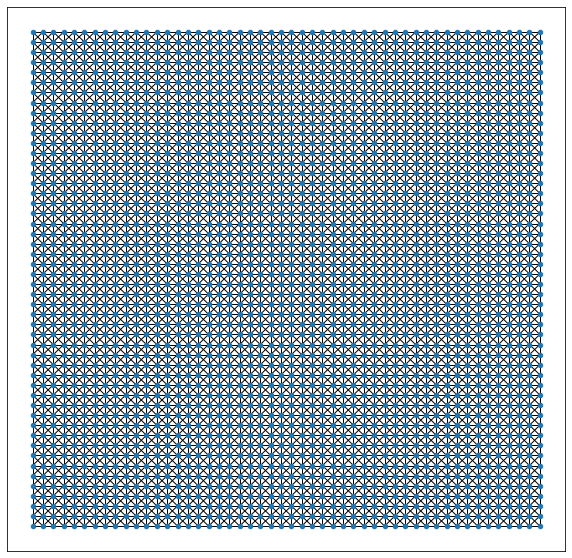

In [11]:
pos_dict = {}
node_data = G.nodes(data=True)
for n in G.nodes():
    pos_dict[n] = np.array(node_data[n]['pos'])

plt.figure(figsize=(10,10))
nx.draw_networkx(G, pos=pos_dict, node_size = 20, with_labels=False)

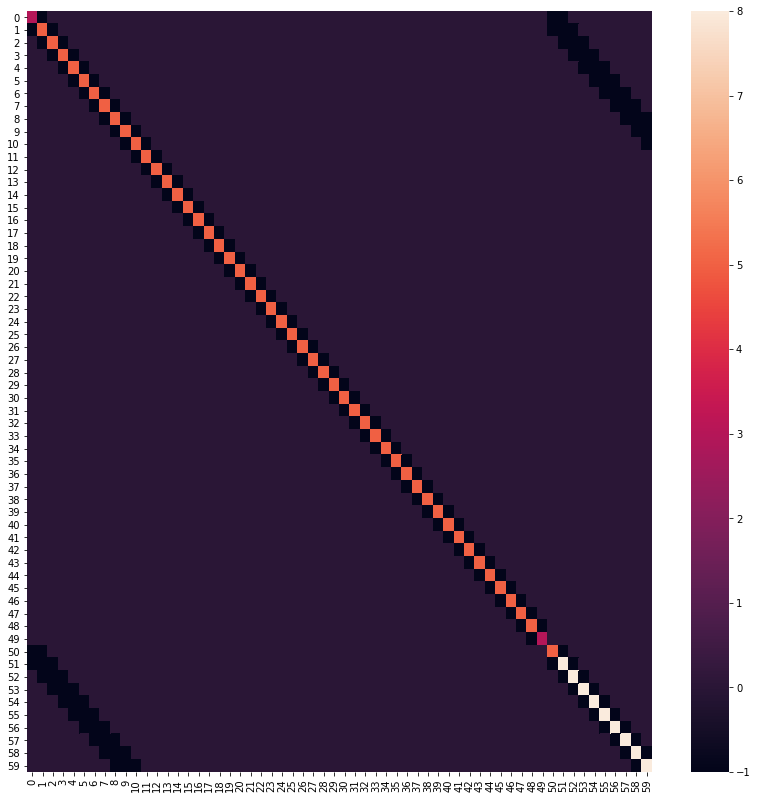

In [12]:
plt.figure(figsize=(14,14))
sns.heatmap(L.todense()[:60,:60])

In [13]:
xf = x.flatten()
yf = y.flatten()
zf = z.flatten()

In [14]:
def get_triangle_vertices(triangles, xf, yf, zf):
    # this is the actual mesh we will plot
    return np.array([np.array([[xf[T[0]], yf[T[0]], zf[T[0]]],
                                    [xf[T[1]], yf[T[1]], zf[T[1]]],
                                    [xf[T[2]], yf[T[2]], zf[T[2]]]]) for T in triangles])
def get_vertices(xf, yf, zf):
    # list of coordinates of each triangle
    return np.array(list(zip(xf, yf, zf)))

triangle_vertices = get_triangle_vertices(triangles, xf, yf, zf)
vertices = get_vertices(xf, yf, zf)

### Visualization of Meshes

In [15]:
def viz(triangle_vertices, facecolors):

    # plot the triangle mesh
    coll = Poly3DCollection(triangle_vertices, facecolors=facecolors, linewidth=0.1,
                        edgecolors='gray')

    fig = plt.figure(figsize=(10,10))
    ax = fig.gca(projection='3d')
    ax.add_collection(coll)
    ax.view_init(elev=0, azim=135)

    plt.axis('off')
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_zlim(-1, 1)
    ax.elev = 50
    return ax

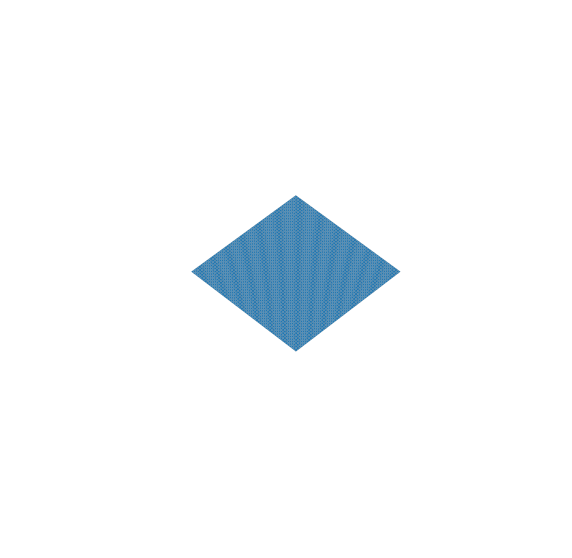

In [16]:
viz(triangle_vertices, None)

#### Coloring a mesh according to curvature

__Basic idea of how to color the mesh:__

1. For each vertex, get all adjacent triangles
    * For each triangle, compute its angle at that vertex
    * Then sum all angles to compute the local curvature at that vertex
3. For each triangle, compute average curvature of its vertices
4. Color the triangle according to the average curvature of its vertices

__Geometry:__

Given a triangle with vertices $p_0, p_1, p_2$.   Assume you want to compute the angle at vertex $p_0$.

Let $v = p_1 - p_0,$ $u = p_2 - p_0$.  Then $\theta = \cos^{-1}\frac{u^T v}{\Vert u\Vert \Vert v\Vert}$

#### Compute the angle of vertex $b$ in triangle $T$

In [17]:
def angle_of_b_in_t(b, T, vertices):
    '''
    for a vertex b which is an index into vertices
    and a triangle T (which is a triple)
    return the angle formed by the two triangles sides at vertex b
    '''
    others = [t for t in T if t != b]
    u = np.array(vertices[others[0]] - vertices[b])
    v = np.array(vertices[others[1]] - vertices[b])
    return np.arccos((u.T @ v) / (np.linalg.norm(u) * np.linalg.norm(v)))

#### Compute the curvature at vertex $b$.

The curvature at a vertex $= 2 \pi - \sum$ angles around vertex

In [18]:
def vertex_curvature(b, t_of_v, vertices):
    # find the angles of the edges incident at each vertex b
    # t_of_v[b] is the set of triangles incident to vertex b
    angles = [angle_of_b_in_t(b, t, vertices) for t in t_of_v[b]]
    if len(angles) == 6:
        # this is an interior vertex
        return 2 * np.pi - np.sum(angles)
    #elif len(angles) == 3:
        #return np.pi - np.sum(angles)
    #elif len(angles) == 2:
        #return (np.pi / 2) - np.sum(angles)
    #elif len(angles) == 1:
        #return (np.pi / 2) - np.sum(angles)
    else:
        # this vertex does not have the standard number of neighbors (6)
        # which happens at the edge of the mesh
        # so just ignore it - will be filtered out of the visualization
        return np.nan 
    
def get_curvature(vertices, t_of_v):
    return np.array([vertex_curvature(v, t_of_v, vertices) for v in range(len(vertices))])

Apply the above functions to compute the curvature at each vertex

In [19]:
t_of_v = Tr.triangles_of_vertex()

#### Visualize

Given the above histogram, the small number of points with very large curvature will distort the scale and hide the variation of curvature around zero.   So we artificially clamp all values above a threshold, and rescale the values close to zero so they can be seen.

In [20]:
def rmap(x, oldmin, newmin, oldmax, newmax, newzero):
    '''
    linear rescaling for visualization purposes
    rescale from range [oldmin, 0] to [newmin, newzero]
    and from [0, oldmax] to [newzero, newmax]
    '''
    if x > 0:
        return (x/oldmax)*(newmax-newzero)+newzero
    elif x < 0:
        return (x/oldmin)*(newmin-newzero)+newzero
    else:
        return newzero
        
def viz_curvature(vertices, t_of_v, triangles, cmap = cm.seismic, maxscale = 0.1):
    
    # compute the curvature at each vertex
    cv = get_curvature(vertices, t_of_v)
    
    # Compute the average curvature for each triangle
    pcv = np.array([np.nanmean(cv[triangles[t]]) for t in range(len(triangles))])

    # for visualization, concentrate on intermediate curvature values
    # only visualize cuvatures in range [-maxscale, maxscale]
    # all other values are set to maxscale or -maxscale

    # first, set all values above maxscale to maxscale 
    pcv[pcv > maxscale] = maxscale
    pcv[pcv < -maxscale] = -maxscale
    
    # remap values and compute colors of each triangle
    facecolors = cmap([rmap(p, -maxscale, 0, maxscale, 1, 0.5) for p in pcv])

    viz(triangle_vertices, facecolors);

## Warping a surface to match a curvature

### Build a test case

Get a curvature value for each point

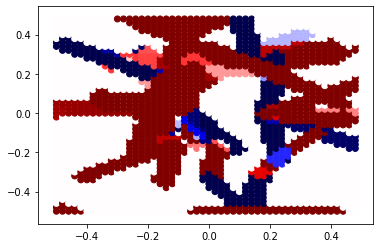

In [21]:
cmap = cm.seismic
maxscale = 0.1
plt.scatter(xf, yf, color = [cmap(rmap(p, -maxscale, 0, maxscale, 1, 0.5)) for p in curvatures.flatten()])

### Loss Function

Let the intended curvature at grid point $i$ be $\kappa(i)$ and the current curvature be $c(i)$.   Then to match the observed curvature, the objective function is:

$$ \mathcal{L} = \sum_i (\kappa(i) - c(i))^2. $$

Each point has three coordinates, ie, $a = (x_a, y_a, z_a)$.  In order to use gradient descent to minimize this loss function we need to compute
$$ \frac{\partial \mathcal{L}}{\partial z} $$
where $z = [z_i]^T$.  Written out, the above is $[\frac{\partial \mathcal{L}}{\partial z_i}]^T$.

### Symmetry breaking

However, note that there is a symmetry-breaking problem here.  From a starting point of a flat surface, we can get positive curvature at $i$ by moving $i_z$ either upwards or downwards.  

Without some correction, this get manifested by creation of adjacent convex and concave regions within the positively curved region.   We get rings of peaks and valleys.

Basic fact:  $x^TLx = \sum_{(u,v)\in E} (x(u) - x(v))^2.$

#### Option 0: Smoothness

Penalize $z^TLz$.  This will reduce "high frequency" variation in the z coordinate.

This seems to work well.  It removes the symmetry-breaking problem at small scales.  

However, peaks can be either negative or positive in general -- symmetry breaks badly at large scales.

Hence, need initialization of $z$ using $\kappa$.

#### Option 1: First derivative smoothness

Penalize variation in local gradient.  As much as possible, each node should be the average of its neighbors.  

This can be accomplished by penalizing:

$$  \sum_ i \left(\sum_{j \in N(i)} (i_z - j_z)\right)^2. $$

where $N(i)$ are the neighbors of $i$.

Expressed using $L$, the Laplacian of the mesh graph:

$$ z^TL^2z. $$

Does not work well -- essentially, works exactly oppositely of main goal, meaning it seeks a flat surface.

#### Option 2: consistent convexity (second derivative smoothness)

Another way to address this is by breaking the symmetry of curvature: penalize adjacency of convex and concave regions.

The concavity $r(v)$ at a node $v$  is $Lz(v)$.  If this value is positive, the region is concave (opening downward).

We want this to be locally smooth, ie, we want to penalize $z^TL^3z$.

This works best of all the above, when combined with initialization of $z$ using $\kappa$.

#### Option p: penalize negative convexity in positively curved regions

The concavity $r(v)$ at a node $v$  is $Lz(v)$.  If this value is positive, the region is concave (opening downward).

So, want to penalize negative values of $Lz$ at points where curvature ($\kappa$) is positive.
This can be expressed as hinge loss applied only in positively curved regions.

$\mathcal{L}_h = h(r(v))$ if $\kappa(v) > 0$, where $h$ is hinge loss function: $h(x) = x$ if $x > 0$, $0$ otherwise.

So $dh/dx = 1$ if $x > 0$, $0$ otherwise.

So $\frac{\partial\mathcal{L}_h}{dz} = \frac{\partial h}{\partial r} \cdot \frac{\partial r}{\partial z} = -Lz(v)$ if $\kappa(v) > 0$ and $Lz(v) < 0$.

### Gradient

The gradient we seek is:
    $$ \frac{\partial \mathcal{L}}{\partial z} = \sum_i 2(\kappa(i) - c(i))\left(-\frac{\partial c(i)}{\partial z}\right) $$
    
(which could be 
    $$ \frac{\partial \mathcal{L}}{\partial z} = \sum_i 2(\kappa(i) - c(i))\left(-\frac{\partial c(i)}{\partial z}\right) + \lambda \frac{\partial f}{\partial z}$$
   if we want to smooth the curvature using one of the above penalizations $f(z)$.)

The curvature at grid point $i$ is
$$ c(i) = 2\pi - \sum_{t\in T(i)} \alpha(t, i)$$ 
where $T(i)$ is the set of triangles that meet at grid point $i$ and $\alpha(t, i)$ is the interior angle of triangle $t$ at grid point $i$.

So $$ \frac{\partial \mathcal{L}}{\partial z} = \sum_i 2(\kappa(i) - c(i))\left(-\frac{\partial c(i)}{\partial z}\right) = \sum_i 2(\kappa(i) - c(i)) \sum_{t\in T(i)} \frac{\partial \alpha(t, i)}{\partial z} $$

For a triangle $t = (a, b, c)$, if we want the angle at $b$, we have by the law of cosines:
$$ \alpha(t, b) = \cos^{-1}\frac{u^T v}{\Vert u\Vert \Vert v\Vert}$$
where $v = a - b,$ $u = c - b$. 

Expanding this out:
    $$ \alpha(t, b) = \cos^{-1}\frac{(c-b)^T (a-b)}{\sqrt{(c-b)^T(c-b)}\sqrt{(a-b)^T(a-b)}}$$

Let $w  = \frac{(c-b)^T (a-b)}{(c-b)^T(c-b) (a-b)^T(a-b)}$.  Then the above is

$$ \alpha(t, b) = \cos^{-1} w $$

and 

$$ \frac{\partial \alpha(t, b)}{\partial z} = - \frac{1}{\sqrt{1 - w^2}} \frac{\partial w}{\partial z} $$

Expanding further:
    
$$w  = \frac{(c-b)^T (a-b)}{\sqrt{(c-b)^T(c-b)}\sqrt{(a-b)^T(a-b)}} = \frac{c^Ta-c^Tb-b^Ta+b^Tb}{\sqrt{(c^Tc-2b^Tc+b^Tb)}\sqrt{(a^Ta-2a^Tb+b^Tb)}} = \frac{f(z)}{g(z)}.$$

By the quotient rule:
$$ \frac{\partial w}{\partial z} = \frac{g(z) \frac{\partial f}{\partial z} - f(z) \frac{\partial g}{\partial z}}{g^2(z)}$$

For clarity let's break $g(z)$ into $p(z)q(z)$.

$$ \frac{\partial g}{\partial z} = p(z) \frac{\partial q}{\partial z} + q(z) \frac{\partial p}{\partial z}$$

with

$$\frac{\partial p}{\partial z} = \frac{(c^Tc)'-(2b^Tc)'+(b^Tb)'}{2\sqrt{(c^Tc-2b^Tc+b^Tb)}} $$

and 

$$\frac{\partial q}{\partial z} = \frac{(a^Ta)'-(2a^Tb)'+(b^Tb)'}{2\sqrt{(a^Ta-2a^Tb+b^Tb)}}$$

Now $ \frac{\partial a^Tb}{\partial z} $
is a vector with $a_z$ in position $b$, $b_z$ in position $a$, and zeros elsewhere.   Likewise $ \frac{\partial a^Ta}{\partial z} $ is a vector with $2a_z$ in position $a$.

Let us use $(a^Tb)'$ to denote $ \frac{\partial a^Tb}{\partial z} $.   Then

$$ \frac{\partial f}{\partial z} = (c^Ta)'-(c^Tb)'-(b^Ta)'+(b^Tb)' $$

is a vector with $(a_z-b_z)$ in position $c$, $(2b_z - a_z - c_z)$ in position $b$, and $(c_z-b_z)$ in position $a$.

Likewise, 
$$ \frac{\partial g}{\partial z} = \sqrt{c^Tc-2b^Tc+b^Tb} \cdot \frac{(a^Ta)'-(2a^Tb)'+(b^Tb)')}{2 \sqrt{a^Ta-2a^Tb+b^Tb}} +\sqrt{a^Ta-2a^Tb+b^Tb} \cdot \frac{(c^Tc)'-2(b^Tc)'+(b^Tb)'}{2\sqrt{c^Tc-2b^Tc+b^Tb}} $$

To evaluate the above it is helpful to note that if $h = (a-b)^T(a-b)$, then

$$ \frac{\partial h}{\partial z} = (a^Ta)' - 2(a^Tb)' + (b^Tb)'$$

which is a vector with $(2a_z - 2b_z)$ in position $a$, and $(2b_z - 2a_z)$ in position $b$.

And we have all the pieces to put together the gradient that we need.

### Functions for computing gradient

Let `apos` be the 1D index of `a`, where `a` is $(a_x, a_y, a_z)$

In [22]:
def df_dz (n, a, apos, b, bpos, c, cpos):
    '''
    partial f / partial z
    f = (c-b)^T (a-b)
    apos is the index of a into the 1D grid vector
    a is [a_x, a_y, a_z]
    '''
    gr = np.zeros(n)
    gr[apos] = c[2] - b[2]
    gr[bpos] = (2 * b[2]) - a[2] - c[2]
    gr[cpos] = a[2] - b[2]
    return gr

def dh_dz(n, a, apos, b, bpos):
    '''
    partial h / partial z
    f = (a-b)^T (a-b)
    apos is the index of a into the 1D grid vector
    a is [a_x, a_y, a_z]
    '''
    gr = np.zeros(n)
    gr[apos] = 2 * (a[2] - b[2])
    gr[bpos] = 2 * (b[2] - a[2])
    return gr

def fz(a, b, c):
    return (c - b).T @ (a - b)

def pz(a, b, c):
    return np.sqrt((c - b).T @ (c - b))

def qz(a, b, c):
    return np.sqrt((a - b).T @ (a - b))

def gz(a, b, c):
    return pz(a, b, c) * qz(a, b, c)

def wz(a, b, c):
    return fz(a, b, c) / gz(a, b, c)

def dq_dz(n, a, apos, b, bpos, c, cpos):
    return dh_dz(n, a, apos, b, bpos) / (2 * qz(a, b, c))
    
def dp_dz(n, a, apos, b, bpos, c, cpos):
    return dh_dz(n, c, cpos, b, bpos) / (2 * pz(a, b, c))

def dg_dz(n, a, apos, b, bpos, c, cpos):
    '''
    partial g / partial z
    g = sqrt((c-b)^(c-b)) * sqrt((a-b)^(a-b))
    apos is the index of a into the 1D grid vector
    a is [a_x, a_y, a_z]
    '''
    gr = pz(a, b, c) * dq_dz(n, a, apos, b, bpos, c, cpos) + qz(a, b, c) * dp_dz(n, a, apos, b, bpos, c, cpos)
    return gr

def dw_dz(n, a, apos, b, bpos, c, cpos):
    return ((gz(a, b, c) * df_dz(n, a, apos, b, bpos, c, cpos)) 
            - (fz(a, b, c) * dg_dz(n, a, apos, b, bpos, c, cpos))) / (gz(a, b, c) * gz(a, b, c))

def dalpha_dz(n, a, apos, b, bpos, c, cpos):
    '''
    partial alpha / partial z
    alpha is angle at vertex b defined by triangle (a, b, c)
    '''
    wzval = wz(a, b, c)
    return - (1/np.sqrt(1 - (wzval * wzval))) * dw_dz(n, a, apos, b, bpos, c, cpos)

In [23]:
def net_dalpha_dz(n, b, triangs, vertices):
    '''
    for a vertex b which is an index into vertices
    and the triangs that contain it
    return the net dalpha_dz vector
    '''
    res = np.zeros(n)
    for T in triangs:
        others = [t for t in T if t != b]
        res += dalpha_dz(n, vertices[others[0]], others[0], vertices[b], b, vertices[others[1]], others[1])
    # experimental - only return gradient for point in question
    newres = np.zeros(n)
    newres[b] = res[b]
    return newres

In [24]:
def L_grad_indiv(n, kappa, c, v, t_of_v, vertices):
    if np.isnan(c[v]):
        return np.zeros(n)
    elif np.isnan(kappa[v]):
        return np.zeros(n)
    else:
        return 2 * (kappa[v] - c[v]) * net_dalpha_dz(n, v, t_of_v[v], vertices)

In [25]:
def L_grad(n, kappa, c, t_of_v, vertices):
    grad = np.zeros(n)
    for v in range(len(vertices)):
        grad += L_grad_indiv(n, kappa, c, v, t_of_v, vertices)
    return grad

In [26]:
def L_grad_penalized(lam, pen_fn, n, kappa, c, t_of_v, vertices):
    basic_grad = L_grad(n, kappa, c, t_of_v, vertices)
    return basic_grad + lam * np.ravel(pen_fn)

In [27]:
def L_grad_penalized_with_convexity(lam_cvx, L, zf, lam, pen_fn, n, kappa, c, t_of_v, vertices):
    pen_grad = L_grad_penalized(lam, pen_fn, n, kappa, c, t_of_v, vertices)
    penalty = - np.ravel(L @ zf)
    kappa_copy = kappa.copy()
    kappa_copy[np.isnan(kappa_copy)] = 0
    kappa_copy[kappa_copy < 0] = 0
    penalty = penalty * kappa_copy
    penalty[penalty < 0] = 0
    return pen_grad - lam_cvx * penalty, penalty

In [28]:
def L_grad_penalized_positized(lam, pen_fn, n, kappa, c, t_of_v, vertices):
    pen_grad = L_grad_penalized(lam, pen_fn, n, kappa, c, t_of_v, vertices)
    for i in range(len(pen_grad)):
        if (kappa[i] > 0) and (c[i] < kappa[i]) and (pen_grad[i] > 0):
            pen_grad[i] = 0
    return pen_grad

In [29]:
def L_grad_penalized_biased(bias_lam, lam, pen_fn, n, kappa, c, t_of_v, vertices):
    pen_grad = L_grad_penalized(lam, pen_fn, n, kappa, c, t_of_v, vertices)
    return pen_grad - bias_lam * np.ones(len(vertices))

In [30]:
# test case
kappa = curvatures.flatten()

In [31]:
zf = 0.001 * curvatures.flatten()
# zf = 0.001 * np.random.random(576)
vertices = get_vertices(xf, yf, zf)
c = get_curvature(vertices, t_of_v)

In [32]:
grad = L_grad(len(vertices), kappa, c, t_of_v, vertices)

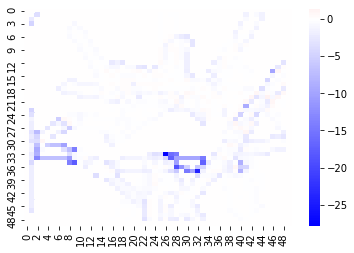

In [33]:
sns.heatmap(np.reshape(grad, (gridsize, gridsize)), cmap = cm.bwr, center = 0)

(2500,)

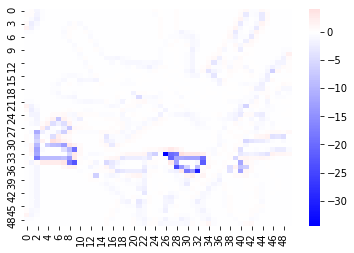

In [34]:
grad = L_grad_penalized(1000, L @ zf, len(vertices), kappa, c, t_of_v, vertices)
sns.heatmap(np.reshape(grad, (gridsize, gridsize)), cmap = cm.bwr, center = 0)
np.ravel(grad).shape

In [35]:
def objfn(kappa, c):
    diff = kappa-c
    diff = diff * diff
    return np.nansum(diff)

def complete_objfn(kappa, c, smooth_pen, penval):
    ob = objfn(kappa, c)
    return ob + smooth_pen * penval

In [36]:
objfn(kappa, c)

145.4669441549581

In [37]:
def single_step(smooth_pen, rate, vertices, kappa, cv_in, t_of_v, xf, yf, zf):
    grad = L_grad_penalized(smooth_pen, L3 @ zf, len(vertices), kappa, cv_in, t_of_v, vertices)
    # grad, penalty = L_grad_penalized_with_convexity(100, L, zf, 10, L3 @ zf, len(vertices), kappa, cv_in, t_of_v, vertices)
    # grad = L_grad_penalized_biased(10, 10, L3 @ zf, len(vertices), kappa, cv_in, t_of_v, vertices)
    new_zf = zf - rate * grad
    new_vertices = get_vertices(xf, yf, new_zf)
    new_cv = get_curvature(new_vertices, t_of_v)
    return new_zf, new_cv, new_vertices, grad

def single_step_with_momentum(prev_step, momentum, smooth_pen, rate, vertices, kappa, cv_in, t_of_v, xf, yf, zf):
    grad = L_grad_penalized(smooth_pen, L3 @ zf, len(vertices), kappa, cv_in, t_of_v, vertices)
    prev_step = ((1-momentum) * grad) + (momentum * prev_step)
    new_zf = zf - rate * prev_step
    new_vertices = get_vertices(xf, yf, new_zf)
    new_cv = get_curvature(new_vertices, t_of_v)
    return new_zf, new_cv, new_vertices, prev_step

In [38]:
# zf = 0.01 * z.flatten()
# zf = 0.001 * np.random.random(576)
zf = kappa.copy()
zf[np.isnan(zf)] = 0
zf[zf<0] = 0
vertices = get_vertices(xf, yf, zf)
cv = get_curvature(vertices, t_of_v)
rate = 0.0001
smooth_pen = 1
of = objfn(kappa, cv)
cof = complete_objfn(kappa, cv, smooth_pen, zf.T @ L3 @ zf)
old_of = of
old_cof = cof
errvals = []
c_errvals = []
momentum = 0.9

In [39]:
print('starting: rate: {} obj fn: {}'.format(rate, of))   

new_zf, new_cv, new_vertices, prev_step = single_step(smooth_pen, rate, vertices, kappa, cv, t_of_v, xf, yf, zf)
while (objfn(kappa, new_cv) > old_of):
    rate = rate / 1.1
    new_zf, new_cv, new_vertices, prev_step = single_step(smooth_pen, rate, vertices, kappa, cv, t_of_v, xf, yf, zf)
    print('setup: -- lowering rate to {}'.format(rate))
old_of = of
old_cof = complete_objfn(kappa, new_cv, smooth_pen, new_zf.T @ L3 @ new_zf)
zf = new_zf
cv = new_cv
vertices = new_vertices

starting: rate: 0.0001 obj fn: 2053.772845995889
setup: -- lowering rate to 9.09090909090909e-05
setup: -- lowering rate to 8.264462809917355e-05
setup: -- lowering rate to 7.513148009015777e-05
setup: -- lowering rate to 6.830134553650706e-05


step: 0 -- lowering rate to 6.20921323059155e-05
step: 1 -- lowering rate to 5.644739300537773e-05
step: 100, obj fn: 140.3959445674907
step: 200, obj fn: 130.56973717546558
step: 298 -- lowering rate to 5.131581182307066e-05
step: 300, obj fn: 127.44535369185704
step: 303 -- lowering rate to 4.665073802097332e-05
step: 305 -- lowering rate to 4.240976183724847e-05
step: 307 -- lowering rate to 3.8554328942953155e-05
step: 309 -- lowering rate to 3.504938994813923e-05
step: 311 -- lowering rate to 3.1863081771035665e-05
step: 313 -- lowering rate to 2.8966437973668783e-05
step: 314 -- lowering rate to 2.633312543060798e-05
step: 315 -- lowering rate to 2.3939204936916344e-05
step: 317 -- lowering rate to 2.1762913579014857e-05
step: 318 -- lowering rate to 1.9784466890013503e-05
step: 319 -- lowering rate to 1.7985878990921365e-05
step: 320 -- lowering rate to 1.6350799082655786e-05
step: 322 -- lowering rate to 1.4864362802414349e-05
step: 323 -- lowering rate to 1.3513057093103952e-0

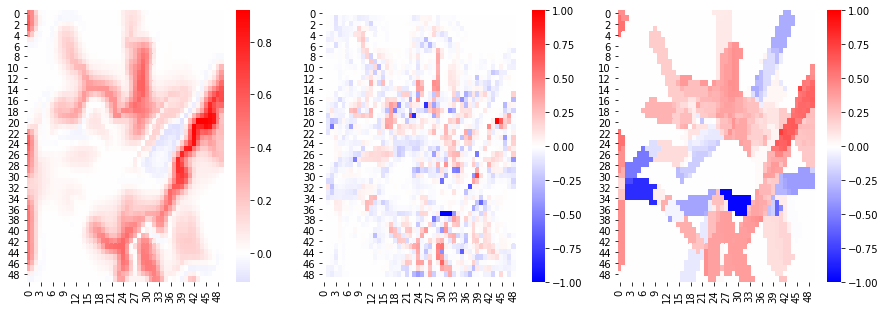

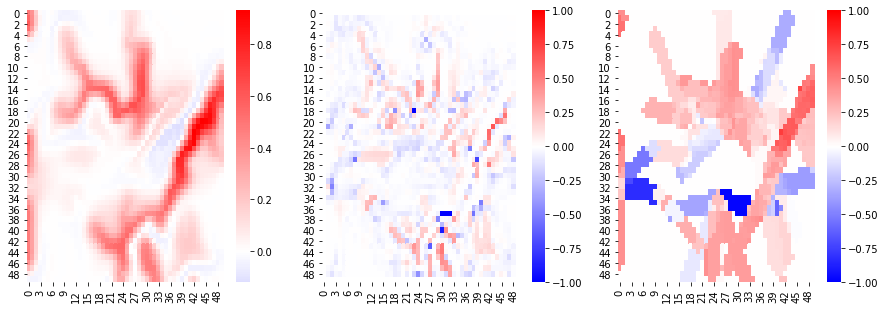

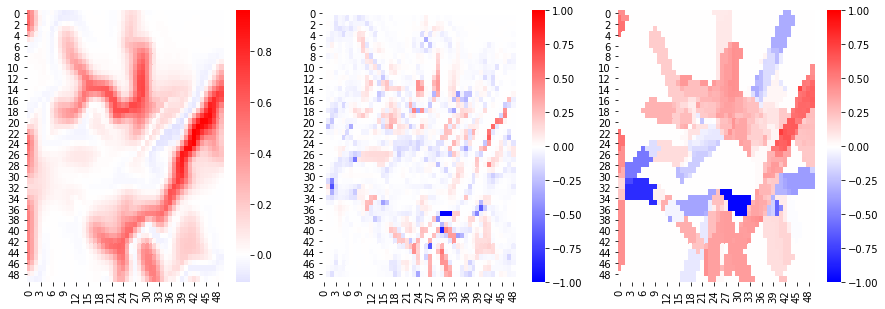

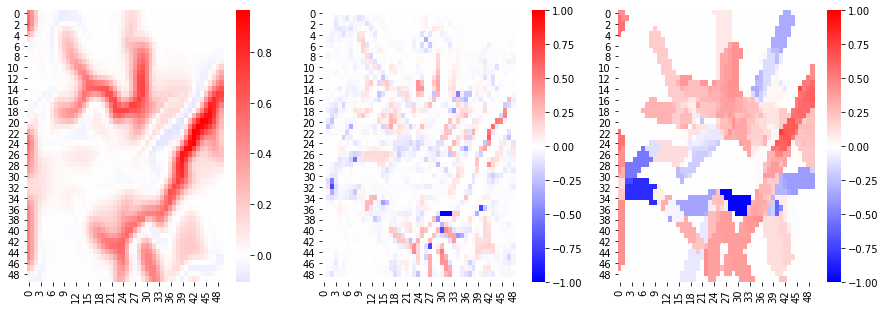

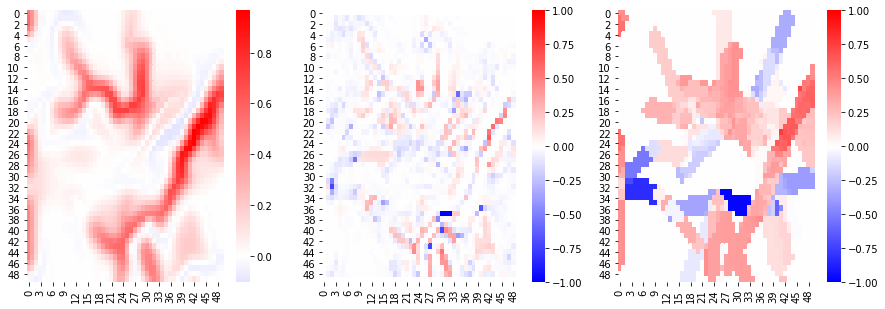

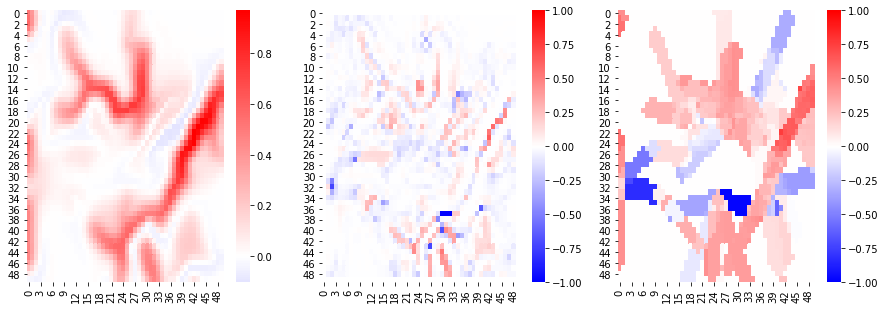

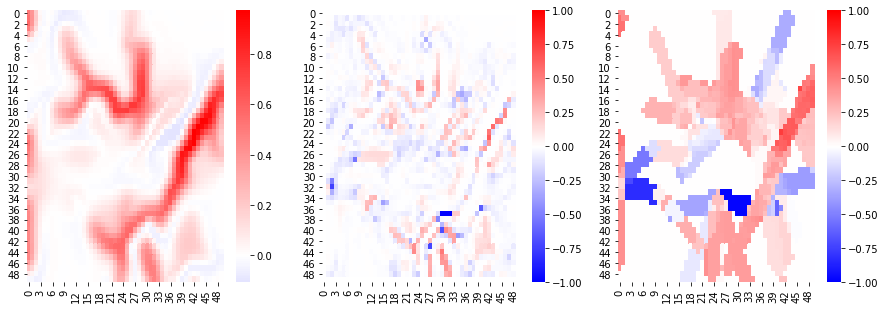

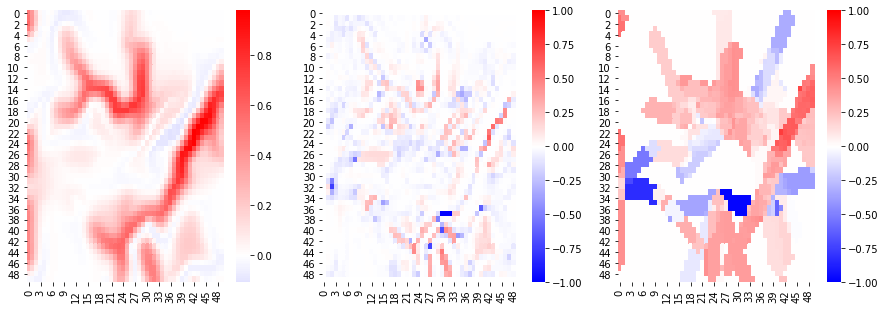

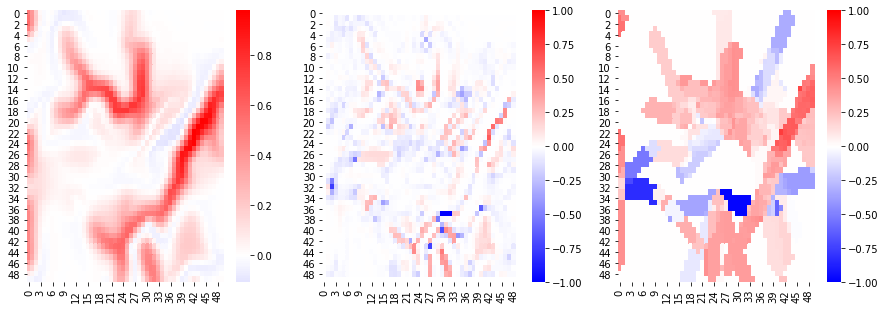

In [40]:
niter = 1000
        
for i in range(niter):
    # new_zf, new_cv, new_vertices, prev_step = single_step(
    #    smooth_pen, rate, vertices, kappa, cv, t_of_v, xf, yf, zf)
    new_zf, new_cv, new_vertices, prev_step = single_step_with_momentum(prev_step, momentum,
        smooth_pen, rate, vertices, kappa, cv, t_of_v, xf, yf, zf)
    of = objfn(kappa, new_cv)
    cof = complete_objfn(kappa, new_cv, smooth_pen, new_zf.T @ L3 @ new_zf)
    # print('step: {} rate: {} obj fn: {} complete obj fn:{}'.format(i, rate, of, cof))
    if (cof > old_cof):
        rate = rate / 1.1
        print('step: {} -- lowering rate to {}'.format(i, rate))
    elif (cof == old_cof):
        # rate has gone so low that no progress at all is being made
        rate = rate * 1.1
        print('step: {} -- raising rate to {}'.format(i, rate))
    else:
        errvals.append(of)
        c_errvals.append(cof)
        old_of = of
        old_cof = cof
        zf = new_zf
        cv = new_cv
        vertices = new_vertices
        if (0 == i % 100):
            print('step: {}, obj fn: {}'.format(i, of))
            fig, axs = plt.subplots(1, 3, figsize=(15,5))
            sns.heatmap(np.reshape(new_zf, (gridsize, gridsize)), cmap = cm.bwr, center = 0, ax = axs[0])
            sns.heatmap(np.reshape(new_cv, (gridsize, gridsize)), cmap = cm.bwr, vmin = -1, vmax = 1, center = 0, ax = axs[1])
            sns.heatmap(np.reshape(kappa, (gridsize, gridsize)), cmap = cm.bwr, vmin = -1, vmax = 1, center = 0, ax = axs[2])
    

print('final: rate: {} obj fn: {}'.format(rate, of))

new_triangle_vertices = np.array([np.array([[xf[T[0]], yf[T[0]], new_zf[T[0]]],
                                    [xf[T[1]], yf[T[1]], new_zf[T[1]]],
                                    [xf[T[2]], yf[T[2]], new_zf[T[2]]]]) for T in triangles])


Text(0.5, 1.0, 'Loss for Curvature Only')

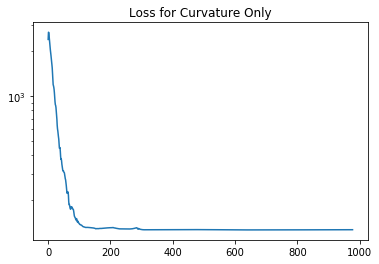

In [41]:
plt.plot(errvals, '-')
plt.yscale('log')
plt.title('Loss for Curvature Only')

Text(0.5, 1.0, 'Complete Objective Function')

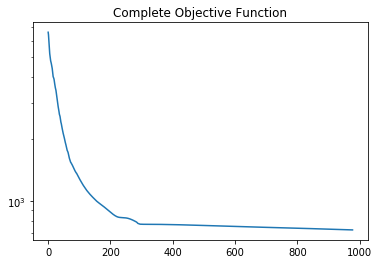

In [42]:
plt.plot(c_errvals, '-')
plt.yscale('log')
plt.title('Complete Objective Function')

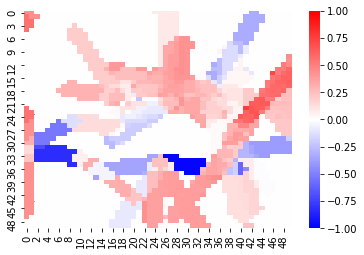

In [43]:
sns.heatmap(np.reshape(kappa, (gridsize, gridsize)), cmap = cm.bwr, vmin = -1, vmax = 1, center = 0)

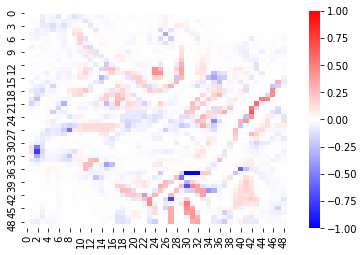

In [44]:
sns.heatmap(np.reshape(new_cv, (gridsize, gridsize)), cmap = cm.bwr, vmin = -1, vmax = 1, center = 0)

/Users/markcrovella/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: Mean of empty slice
  """Entry point for launching an IPython kernel.
/Users/markcrovella/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in greater
  after removing the cwd from sys.path.
/Users/markcrovella/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in less
  """


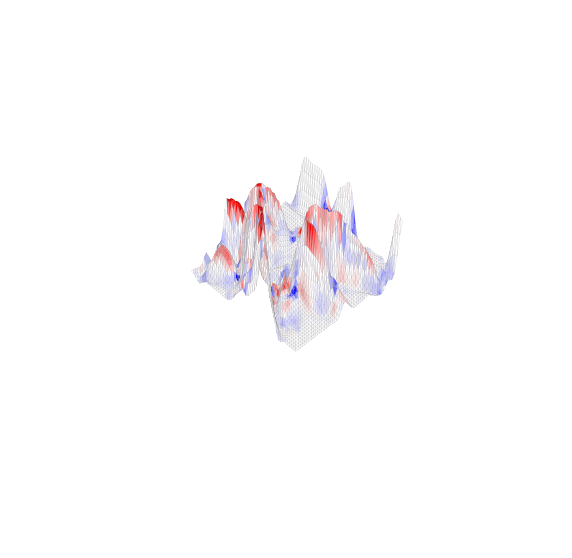

In [45]:
pcv = np.array([np.nanmean(cv[triangles[t]]) for t in range(len(triangles))])
maxscale = .5
# first, set all values above maxscale to maxscale 
pcv[pcv > maxscale] = maxscale
pcv[pcv < -maxscale] = -maxscale
facecolors = cmap([rmap(p, - maxscale, 0, maxscale, 1, 0.5) for p in pcv])
triangle_vertices = get_triangle_vertices(triangles, xf, yf, zf)
viz(triangle_vertices, facecolors)

In [46]:
# plotting options:
# plot_surface: https://matplotlib.org/gallery/mplot3d/custom_shaded_3d_surface.html#sphx-glr-gallery-mplot3d-custom-shaded-3d-surface-py
# plot_trisurf
# Poly3DCollection directly

In [47]:
triangulation = mp.tri.Triangulation(xf, yf, triangles=triangles)

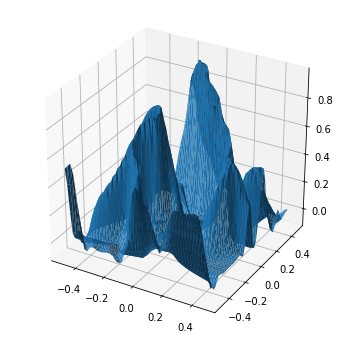

In [48]:
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')

#ax.axes.set_xlim([xmin, xmax])
#ax.axes.set_ylim([ymin, ymax])
#ax.axes.set_zlim([zmin, zmax])
#ax.axes.set_xlabel('$x_1$',size=15)
#ax.axes.set_ylabel('$x_2$',size=15)
#ax.axes.set_zlabel('$x_3$',size=15)

#triang = mp.tri.Triangulation(X, Y, triangles=triangles)

#zs = np.array([fun(x, y) for x, y in zip(X, Y)])
facecolors = cmap([rmap(p, -maxscale, 0, maxscale, 1, 0.5) for p in pcv])
ax.plot_trisurf(triangulation,
                            zf,
                            # color='red',
                            # alpha=alpha,
                            linewidth=0, facecolors = facecolors)
plt.show()

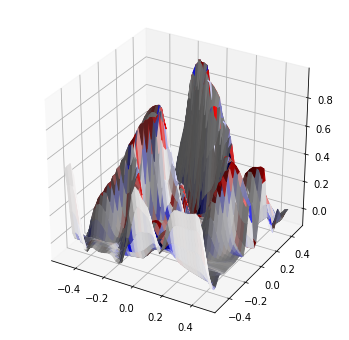

In [49]:
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')
x = np.reshape(xf, (gridsize, gridsize))
y = np.reshape(yf, (gridsize, gridsize))
z = np.reshape(zf, (gridsize, gridsize))
#zs = np.array([fun(x, y) for x, y in zip(X, Y)])
cvcol = cv.copy()
cvcol[np.isnan(cvcol)] = 0
maxscale = .5
cvcol = cmap([rmap(p, -  maxscale, 0, maxscale, 1, 0.5) for p in cvcol])
cvcol = np.reshape(cvcol, (gridsize, gridsize, 4))
ax.plot_surface(x, y, z, facecolors = cvcol)

In [50]:
labels = pd.read_csv('Data/map_points.csv')
x_axis_vals = list(refc.columns.values)
y_axis_vals = list(refc.index.values)
for i in labels.iterrows():
    print(i[1])
    lbl = i[1][0]
    xpt = i[1][1]
    ypt = i[1][2]
    xndx = x_axis_vals.index(i[1][1])
    yndx = y_axis_vals.index(i[1][2])
    print(xndx, yndx)
    zpt = z[yndx, xndx]
    print(lbl, xpt, ypt, zpt)
    

Label      MA
 X       0.48
 Y      -0.24
Name: 0, dtype: object
49 13
MA 0.48 -0.24 0.49999166238404025
Label      NY
 X       0.44
 Y      -0.16
Name: 1, dtype: object
47 17
NY 0.44 -0.16 0.8222762068577858
Label      VA
 X       0.36
 Y      -0.08
Name: 2, dtype: object
43 21
VA 0.36 -0.08 0.9815629173055939
Label      GA
 X       0.24
 Y       0.14
Name: 3, dtype: object
37 32
GA 0.24 0.14 0.7225185868722849
Label      KS
 X       0.02
 Y      -0.08
Name: 4, dtype: object
26 21
KS 0.02 -0.08 0.20794342238875588
Label      TX
 X          0
 Y       0.18
Name: 5, dtype: object
25 34
TX 0.0 0.18 0.17740013580026848
Label      WA
 X       -0.5
 Y      -0.46
Name: 6, dtype: object
0 2
WA -0.5 -0.46 0.5663917297252343
Label      CA
 X       -0.5
 Y      -0.04
Name: 7, dtype: object
0 23
CA -0.5 -0.04 0.475882752565821
Label      AZ
 X       -0.3
 Y       0.14
Name: 8, dtype: object
10 32
AZ -0.3 0.14 0.034875816151773424
Label      MI
 X       0.22
 Y      -0.26
Name: 9, dtype: object
36

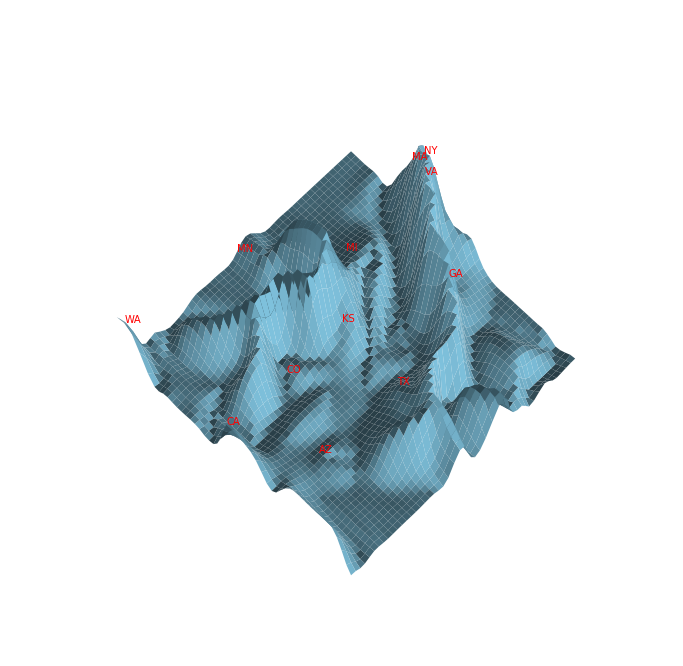

In [51]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111, projection='3d')
ls = mp.colors.LightSource(azdeg = 270, altdeg = 30)
ax.view_init(azim = 315, elev = 75)
plt.axis('off')
ax.plot_surface(x, y, z, rcount = gridsize, ccount = gridsize, color='skyblue', lightsource = ls) #, facecolors = cvcol, lightsource = ls)
labels = pd.read_csv('Data/map_points.csv')
x_axis_vals = list(refc.columns.values)
y_axis_vals = list(refc.index.values)
for i in labels.iterrows():
    lbl = i[1][0]
    xpt = i[1][1]
    ypt = i[1][2]
    xndx = x_axis_vals.index(i[1][1])
    yndx = y_axis_vals.index(i[1][2])
    zpt = z[yndx, xndx]
    ax.text(ypt, xpt, zpt, lbl, color='red')

In [52]:
from matplotlib import animation

In [53]:
# two methods for animation - see:
# http://louistiao.me/posts/notebooks/embedding-matplotlib-animations-in-jupyter-as-interactive-javascript-widgets/
# 1 - directly inline via %matplotlib notebook - advantage: real-time, disadvantage: no manual control
# 2 - encode as video, embedded into notebook (base64) and display via notebook player or JS widget
#     downside - not real time, need to generate complete video before it can be displayed
# 2a - HTML(anim.to_html5_video())  [notebook player, bare bones] [uses html5 <video> tag]
# 2b - HTML(anim.to_jshtml())  [JS widget, extra controls]
# these latter can be made default representation via next line, which can also be 'html5'
mp.rcParams['animation.html'] = 'jshtml'
# 3 - save as an animated GIF and display using 
# rot_animation.save('rotation.gif', dpi=80, writer='imagemagick')
# ![RotatingImage](rotation.gif "Quadratic Form")
# see also https://stackoverflow.com/questions/35532498/animation-in-ipython-notebook/46878531#46878531

In [54]:
# putting plt.show() works for %matplotlib notebook
def rotate(angle):
    ax.view_init(azim = angle, elev = 75)
    # ax.plot_surface(x, y, z, alpha = 1, rcount = gridsize, ccount = gridsize, facecolors = cvcol, lightsource = ls)
    # plt.show()

rot_animation = animation.FuncAnimation(fig, 
                                        rotate, 
                                        frames=np.arange(0,360,5), 
                                        interval=100, 
                                        repeat=False)
plt.close()
rot_animation

In [55]:
# see https://matplotlib.org/3.2.1/api/_as_gen/matplotlib.animation.Animation.html#matplotlib.animation.Animation.save
fname = 'Output/sp{:d}i{:d}.gif'.format(smooth_pen, niter)
rot_animation.save(fname, dpi=80, writer='imagemagick')